## Project Overview

This project focuses on utilizing the PASCAL VOC 2012 dataset to train a YOLOv8 (You Only Look Once version 8) object detection model. The model is designed to automatically detect and classify various objects, including cars, animals, and people, in real-time. The overarching goal is to develop a robust system capable of identifying objects in images, with applications in areas such as surveillance, autonomous driving, and industrial automation.

---

## Why This Project Matters

Object detection plays a pivotal role in several cutting-edge technologies, including self-driving vehicles, security systems, and automation processes. By training a machine learning model to detect objects in images, the system can operate autonomously, reducing the reliance on human input, minimizing errors, and increasing efficiency. This project serves as a foundational step toward creating advanced object detection systems, which are essential for real-time, high-accuracy applications.

---

## Key Features

- **Data Preprocessing:** The project involves converting the PASCAL VOC dataset annotations into the YOLO format, making the dataset optimized for training object detection models.
- **Dataset Subsetting:** A random subset of the dataset is selected for training and validation, ensuring that the model is exposed to a diverse range of examples and generalizes well across different object types.
- **Model Training:** Using the YOLOv8 architecture, the model is trained to detect 20 distinct object classes, ranging from animals and people to various types of vehicles.
- **Performance Evaluation:** After training, the model's performance is assessed using key metrics, including Precision, Recall, and mAP (Mean Average Precision), providing a comprehensive evaluation of the model's object detection accuracy.

---

## Skills and Technologies Used

- **Python:** The primary programming language for data processing, model training, and evaluation.
- **Machine Learning & Deep Learning:** Implementing the YOLOv8 architecture for efficient object detection.
- **Data Processing:** Converting and preparing the dataset into the YOLO-compatible format to facilitate model training.
- **Model Evaluation:** Leveraging performance metrics such as Precision, Recall, and mAP to measure and optimize the model's accuracy and efficiency.

---

This project serves as a practical introduction to state-of-the-art object detection techniques, providing the necessary tools and methods to develop real-time detection systems for a wide range of applications

In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.1/875.1 kB 23.7 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import torchvision
from torchvision import datasets, transforms
import os
import random 
import xml.etree.ElementTree as ET
import shutil

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
VOC_CLASSES = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
               'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse',
               'motorbike', 'person', 'pottedplant', 'sheep', 'sofa',
               'train', 'tvmonitor']

In [4]:
def convert_voc_to_yolo(voc_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    
    # Iterating Over Annotation Files
    for xml_file in os.listdir(os.path.join(voc_dir, 'Annotations')):
        tree = ET.parse(os.path.join(voc_dir, 'Annotations', xml_file))
        root = tree.getroot()

        img_width = int(root.find('size/width').text)
        img_height = int(root.find('size/height').text)

        yolo_annotation = []
        for obj in root.findall('object'):
            class_id = VOC_CLASSES.index(obj.find('name').text)
            bbox = obj.find('bndbox')
            xmin, ymin, xmax, ymax = [float(bbox.find(tag).text) for tag in ['xmin', 'ymin', 'xmax', 'ymax']]
            x_center = (xmin + xmax) / 2 / img_width
            y_center = (ymin + ymax) / 2 / img_height
            width = (xmax - xmin) / img_width
            height = (ymax - ymin) / img_height
            yolo_annotation.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

        # saving the converted annotations to a text file.    
        with open(os.path.join(output_dir, f"{root.find('filename').text.split('.')[0]}.txt"), 'w') as f:
            f.write("\n".join(yolo_annotation))

In [5]:
# Setting directory paths & calling the convert method
voc_dir = "/kaggle/input/pascal-voc-2012/VOC2012"
output_dir = "/kaggle/working/VOCdevkit/VOC2012/labels"
convert_voc_to_yolo(voc_dir, output_dir)

In [6]:
import os
import random
import shutil
from PIL import Image

# Path to directories
voc_images_dir = "/kaggle/input/pascal-voc-2012/VOC2012/JPEGImages"
voc_labels_dir = "/kaggle/working/VOCdevkit/VOC2012/labels"
imagesets_dir = "/kaggle/input/pascal-voc-2012/VOC2012/ImageSets/Main"
subset_train_dir = "/kaggle/working/VOCdevkit/VOC2012/train"
subset_val_dir = "/kaggle/working/VOCdevkit/VOC2012/val"

# Create directories for the subset
os.makedirs(os.path.join(subset_train_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(subset_train_dir, "labels"), exist_ok=True)
os.makedirs(os.path.join(subset_val_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(subset_val_dir, "labels"), exist_ok=True)

# Function to select a random subset
def select_random_subset(list_file, subset_size):
    with open(list_file, 'r') as f:
        file_list = f.read().strip().split()
    random.shuffle(file_list)
    return file_list[:subset_size]

# Function to copy images and labels and return image paths
def copy_files_from_list(file_list, source_img_dir, source_lbl_dir, dest_img_dir, dest_lbl_dir):
    image_paths = []
    for file_name in file_list:
        img_file = file_name + ".jpg"
        lbl_file = file_name + ".txt"

        # Copy image
        shutil.copy(os.path.join(source_img_dir, img_file), os.path.join(dest_img_dir, img_file))

        # Copy corresponding label
        shutil.copy(os.path.join(source_lbl_dir, lbl_file), os.path.join(dest_lbl_dir, lbl_file))

        # Append image path
        image_paths.append(os.path.join(dest_img_dir, img_file))

    return image_paths

# Define the subset size
train_subset_size = 3000
val_subset_size = 300

# Select random subsets
train_files_subset = select_random_subset(os.path.join(imagesets_dir, "train.txt"), train_subset_size)
val_files_subset = select_random_subset(os.path.join(imagesets_dir, "val.txt"), val_subset_size)

# Copy training subset to the directories
train_image_paths = copy_files_from_list(train_files_subset, voc_images_dir, voc_labels_dir,
                                         os.path.join(subset_train_dir, "images"), os.path.join(subset_train_dir, "labels"))

# Copy validation subset to the directories
val_image_paths = copy_files_from_list(val_files_subset, voc_images_dir, voc_labels_dir,
                                       os.path.join(subset_val_dir, "images"), os.path.join(subset_val_dir, "labels"))
print("done")
# Print sample image paths
print("Sample training image paths:")
for image_path in train_image_paths[:2]:
    print(image_path)

print("Sample validation image paths:")
for image_path in val_image_paths[:2]:
    print(image_path)

done
Sample training image paths:
/kaggle/working/VOCdevkit/VOC2012/train/images/2009_003808.jpg
/kaggle/working/VOCdevkit/VOC2012/train/images/2009_002912.jpg
Sample validation image paths:
/kaggle/working/VOCdevkit/VOC2012/val/images/2009_000472.jpg
/kaggle/working/VOCdevkit/VOC2012/val/images/2009_001648.jpg


In [7]:
import os
import shutil
import random
from collections import defaultdict

# Path to directories
voc_images_dir = "/kaggle/input/pascal-voc-2012/VOC2012/JPEGImages"
voc_labels_dir = "/kaggle/working/VOCdevkit/VOC2012/labels"
imagesets_dir = "/kaggle/input/pascal-voc-2012/VOC2012/ImageSets/Main"
subset_train_dir = "/kaggle/working/VOCdevkit/VOC2012/train"
subset_val_dir = "/kaggle/working/VOCdevkit/VOC2012/val"

# Create directories for the subset
os.makedirs(os.path.join(subset_train_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(subset_train_dir, "labels"), exist_ok=True)
os.makedirs(os.path.join(subset_val_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(subset_val_dir, "labels"), exist_ok=True)

# Function to select a random subset
def select_random_subset(list_file, subset_size):
    with open(list_file, 'r') as f:
        file_list = f.read().strip().split()
    random.shuffle(file_list)
    return file_list[:subset_size]

# Function to copy images and labels and return image paths
def copy_files_from_list(file_list, source_img_dir, source_lbl_dir, dest_img_dir, dest_lbl_dir):
    image_paths = []
    for file_name in file_list:
        img_file = file_name + ".jpg"
        lbl_file = file_name + ".txt"

        # Copy image
        shutil.copy(os.path.join(source_img_dir, img_file), os.path.join(dest_img_dir, img_file))

        # Copy corresponding label
        shutil.copy(os.path.join(source_lbl_dir, lbl_file), os.path.join(dest_lbl_dir, lbl_file))

        # Append image path
        image_paths.append(os.path.join(dest_img_dir, img_file))

    return image_paths

# Define the subset size
train_subset_size = 3000
val_subset_size = 300

# Select random subsets
train_files_subset = select_random_subset(os.path.join(imagesets_dir, "train.txt"), train_subset_size)
val_files_subset = select_random_subset(os.path.join(imagesets_dir, "val.txt"), val_subset_size)

# Copy training subset to the directories
train_image_paths = copy_files_from_list(train_files_subset, voc_images_dir, voc_labels_dir,
                                         os.path.join(subset_train_dir, "images"), os.path.join(subset_train_dir, "labels"))

# Copy validation subset to the directories
val_image_paths = copy_files_from_list(val_files_subset, voc_images_dir, voc_labels_dir,
                                       os.path.join(subset_val_dir, "images"), os.path.join(subset_val_dir, "labels"))

# Function to count images per class
def count_images_per_class(labels_dir):
    class_count = defaultdict(int)  # Initialize a dictionary to count classes

    # Loop through label files
    for label_file in os.listdir(labels_dir):
        if label_file.endswith('.txt'):
            with open(os.path.join(labels_dir, label_file), 'r') as f:
                # Read all lines in the label file
                lines = f.readlines()
                # Count occurrences of each class
                for line in lines:
                    # Split the line and take the first value as class ID
                    class_id = int(line.strip().split()[0])  # Get the class ID from the first value
                    class_count[class_id] += 1

    return class_count


class_names = [
    "person", "bird", "car", "cat", "dog",
    "horse", "sheep", "aeroplane", "bicycle",
    "boat", "bus", "motorbike", "train", "cow",
    "elephant", "bear", "giraffe", "zebra",
    "sofa", "tvmonitor"
]

# Count images per class for training and validation
train_class_counts = count_images_per_class(os.path.join(subset_train_dir, "labels"))
val_class_counts = count_images_per_class(os.path.join(subset_val_dir, "labels"))

# Print counts
print("Training images per class:")
for class_id, count in train_class_counts.items():
    print(f"{class_names[class_id]}: {count}")

print("\nValidation images per class:")
for class_id, count in val_class_counts.items():
    print(f"{class_names[class_id]}: {count}")

print("done")


Training images per class:
bird: 299
train: 286
elephant: 3891
car: 449
aeroplane: 481
person: 342
cow: 272
sofa: 259
sheep: 930
giraffe: 394
horse: 254
cat: 397
motorbike: 566
boat: 266
bicycle: 1137
bus: 297
bear: 435
dog: 598
tvmonitor: 329
zebra: 322

Validation images per class:
cat: 44
person: 59
elephant: 473
zebra: 32
cow: 35
sofa: 41
motorbike: 86
train: 50
sheep: 92
bear: 24
dog: 65
bus: 33
boat: 49
tvmonitor: 47
aeroplane: 61
horse: 23
car: 51
bicycle: 131
giraffe: 48
bird: 35
done


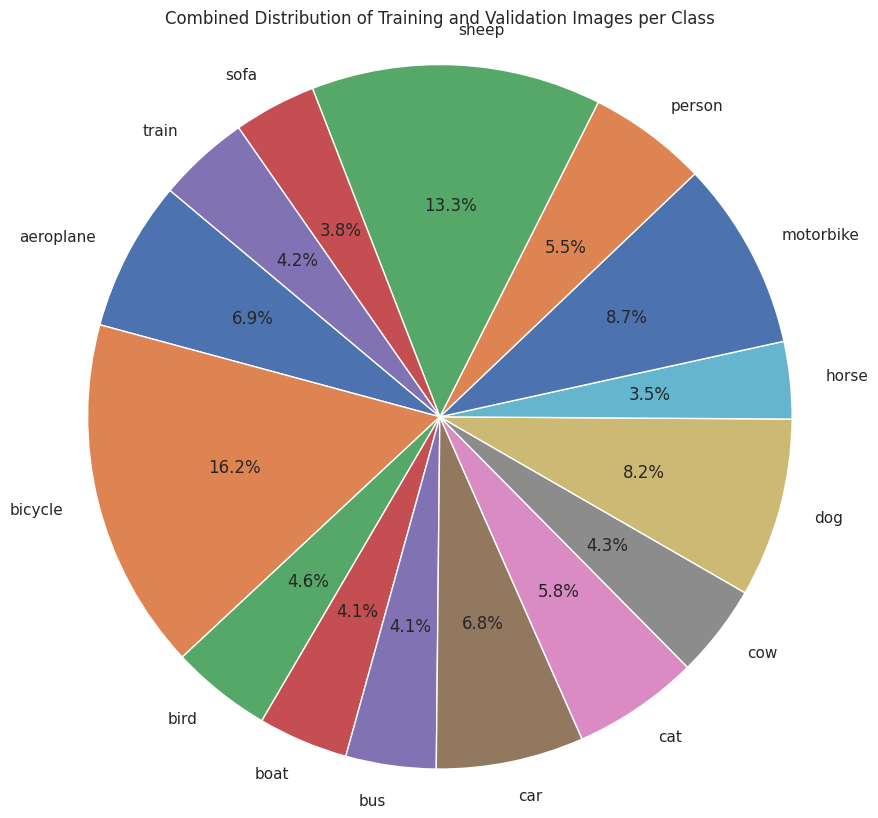

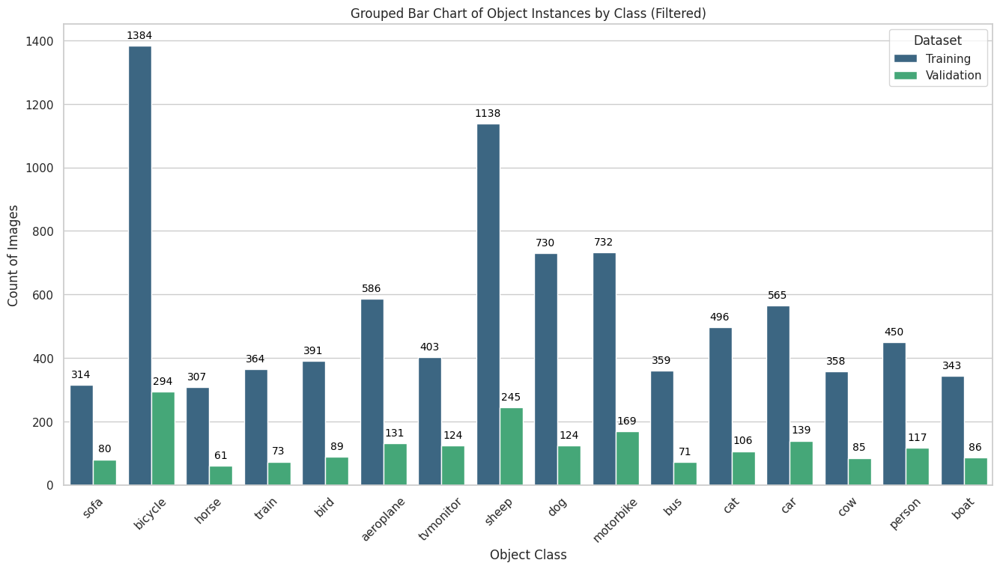

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Data for training and validation images per class
train_data = {
    'Object Class': ['sofa', 'bicycle', 'horse', 'train', 'elephant', 'bird', 'bear', 'aeroplane',
                     'tvmonitor', 'sheep', 'dog', 'motorbike', 'bus', 'cat', 'car', 'zebra',
                     'cow', 'person', 'boat', 'giraffe'],
    'Count': [314, 1384, 307, 364, 4829, 391, 531, 586, 403, 1138, 730, 732, 359, 496, 565, 380, 358, 450, 343, 492]
}

val_data = {
    'Object Class': ['horse', 'elephant', 'sheep', 'cat', 'aeroplane', 'car', 'dog', 'motorbike',
                     'sofa', 'person', 'bicycle', 'bus', 'zebra', 'bird', 'cow', 'bear', 'tvmonitor',
                     'train', 'giraffe', 'boat'],
    'Count': [61, 1061, 245, 106, 131, 139, 124, 169, 80, 117, 294, 71, 75, 89, 85, 106, 124, 73, 99, 86]
}

# Create DataFrames
train_df = pd.DataFrame(train_data)
val_df = pd.DataFrame(val_data)

# Merge training and validation DataFrames
train_df['Dataset'] = 'Training'
val_df['Dataset'] = 'Validation'
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Define classes of interest (animals, vehicles, birds, and people)
classes_of_interest = [
    'aeroplane', 'bicycle', 'bird', 'boat', 
    'bus', 'car', 'cat', 'cow', 'dog', 
    'horse', 'motorbike', 'person', 'sheep', 'sofa', 'train'
]

# Filter the combined DataFrame for classes of interest
highlighted_df = combined_df[combined_df['Object Class'].isin(classes_of_interest)]

# Combine counts for the pie chart
combined_counts = highlighted_df.groupby('Object Class')['Count'].sum().reset_index()

# Set the style of seaborn
sns.set(style='whitegrid')

# 1. Combined Pie Chart for Class Distribution
plt.figure(figsize=(10, 10))
plt.pie(combined_counts['Count'], 
        labels=combined_counts['Object Class'], 
        autopct='%1.1f%%', startangle=140)
plt.title('Combined Distribution of Training and Validation Images per Class')
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is circular.
plt.show()
# Set the style of seaborn
sns.set(style='whitegrid')

# Grouped Bar Chart with Values on Top for Filtered Classes
plt.figure(figsize=(16, 8))
bar_plot = sns.barplot(x='Object Class', y='Count', hue='Dataset', data=filtered_combined_df, palette='viridis')
plt.title('Grouped Bar Chart of Object Instances by Class (Filtered)')
plt.xlabel('Object Class')
plt.ylabel('Count of Images')
plt.xticks(rotation=45)
plt.legend(title='Dataset')

# Adding values on top of each bar
for p in bar_plot.patches:
    bar_plot.annotate(f'{int(p.get_height())}', 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', 
                      fontsize=10, color='black', 
                      xytext=(0, 5),  # Text offset
                      textcoords='offset points')

plt.show()

In [8]:
import os

# Define the paths to the training and validation image directories
train_image_dir = '/kaggle/working/VOCdevkit/VOC2012/train/images'
val_image_dir = '/kaggle/working/VOCdevkit/VOC2012/val/images'

# Count the number of images in the training directory
train_images = [f for f in os.listdir(train_image_dir) if f.endswith('.jpg')]
num_train_images = len(train_images)

# Count the number of images in the validation directory
val_images = [f for f in os.listdir(val_image_dir) if f.endswith('.jpg')]
num_val_images = len(val_images)

# Print the results
print(f'Total number of training images: {num_train_images}')
print(f'Total number of validation images: {num_val_images}')


Total number of training images: 4403
Total number of validation images: 580


In [23]:
yaml_content = """
train: /kaggle/working/VOCdevkit/VOC2012/train/images
val: /kaggle/working/VOCdevkit/VOC2012/val/images

nc: 20  # number of classes
names: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
        'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse',
        'motorbike', 'person', 'pottedplant', 'sheep', 'sofa',
        'train', 'tvmonitor']
"""

# Save the YAML content to a file
yaml_path = "/kaggle/working/voc2012_subset.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_content)

In [24]:
 #Disable wandb
os.environ['WANDB_MODE'] = 'disabled'
model = YOLO('yolov8n.pt') 
model.train(data=yaml_path, epochs=25, imgsz=256, batch=20)

100%|██████████| 6.25M/6.25M [00:00<00:00, 72.6MB/s]


Ultralytics YOLOv8.2.101 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)

engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/voc2012_subset.yaml, epochs=25, time=None, patience=100, batch=20, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

100%|██████████| 755k/755k [00:00<00:00, 13.8MB/s]

2024-09-26 12:54:40,755	INFO util.py:124 -- Outdated packages:

  ipywidgets==7.7.1 found, needs ipywidgets>=8

Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.

2024-09-26 12:54:42,010	INFO util.py:124 -- Outdated packages:

  ipywidgets==7.7.1 found, needs ipywidgets>=8

Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=20



                   from  n    params  module                                       arguments                     

  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 

  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                

  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             

  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                

  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             

  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               

  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           

  7                  -1  1    295424  

train: Scanning /kaggle/working/VOCdevkit/VOC2012/train/labels... 5481 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5481/5481 [00:05<00:00, 914.03it/s]


train: New cache created: /kaggle/working/VOCdevkit/VOC2012/train/labels.cache

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.

  check_for_updates()

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  self.pid = os.fork()

val: Scanning /kaggle/working/VOCdevkit/VOC2012/val/labels... 1265 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1265/1265 [00:01<00:00, 864.05it/s]

val: New cache created: /kaggle/working/VOCdevkit/VOC2012/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 

optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.00046875), 63 bias(decay=0.0)

TensorBoard: model graph visualization added ✅

Image sizes 256 train, 256 val

Using 2 dataloader workers

Logging results to runs/detect/train

Starting training for 25 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25     0.612G       1.28      3.375      1.269          6        256: 100%|██████████| 275/275 [00:33<00:00,  8.22it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.35it/s]


                   all       1265       3335       0.54      0.388      0.395      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25     0.512G      1.313      2.187       1.29          5        256: 100%|██████████| 275/275 [00:29<00:00,  9.21it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.90it/s]


                   all       1265       3335      0.578      0.449      0.466      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25     0.547G      1.279      1.944        1.3          8        256: 100%|██████████| 275/275 [00:27<00:00,  9.84it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.88it/s]


                   all       1265       3335      0.565      0.439       0.45      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25     0.558G      1.277      1.895      1.296          2        256: 100%|██████████| 275/275 [00:28<00:00,  9.65it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.90it/s]


                   all       1265       3335      0.595      0.453      0.479      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25     0.556G      1.242      1.806      1.275          5        256: 100%|██████████| 275/275 [00:28<00:00,  9.72it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.94it/s]


                   all       1265       3335      0.639      0.466      0.508      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25     0.528G      1.228       1.75      1.266          4        256: 100%|██████████| 275/275 [00:27<00:00,  9.91it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.85it/s]


                   all       1265       3335      0.606      0.477       0.52      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25     0.545G      1.215      1.709      1.256          4        256: 100%|██████████| 275/275 [00:28<00:00,  9.67it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]


                   all       1265       3335      0.599      0.474      0.506      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25     0.531G      1.197      1.658      1.251          2        256: 100%|██████████| 275/275 [00:27<00:00,  9.85it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]


                   all       1265       3335      0.656      0.482      0.532      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25     0.562G      1.188       1.64      1.243         11        256: 100%|██████████| 275/275 [00:28<00:00,  9.73it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.82it/s]


                   all       1265       3335      0.657      0.472      0.523      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25     0.577G      1.161      1.579      1.232          2        256: 100%|██████████| 275/275 [00:28<00:00,  9.74it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.64it/s]


                   all       1265       3335      0.689      0.484      0.549      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25     0.543G      1.143      1.538       1.22          2        256: 100%|██████████| 275/275 [00:27<00:00,  9.90it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]


                   all       1265       3335      0.614      0.508      0.548      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25     0.528G      1.136      1.524      1.217          3        256: 100%|██████████| 275/275 [00:28<00:00,  9.67it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.82it/s]


                   all       1265       3335      0.655      0.516      0.561      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25     0.573G      1.129      1.507      1.213         16        256: 100%|██████████| 275/275 [00:28<00:00,  9.80it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.85it/s]


                   all       1265       3335      0.662      0.504      0.563      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25     0.575G      1.118      1.465      1.203          3        256: 100%|██████████| 275/275 [00:28<00:00,  9.54it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.95it/s]


                   all       1265       3335      0.701      0.516      0.574      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25     0.537G      1.112      1.453      1.205          4        256: 100%|██████████| 275/275 [00:28<00:00,  9.72it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.95it/s]


                   all       1265       3335      0.693      0.524      0.573      0.394

Closing dataloader mosaic

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  self.pid = os.fork()

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  self.pid = os.fork()




      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25     0.543G      1.069      1.318      1.147          3        256: 100%|██████████| 275/275 [00:28<00:00,  9.66it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.01it/s]


                   all       1265       3335      0.686      0.527      0.578      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25     0.537G      1.054      1.226      1.141          1        256: 100%|██████████| 275/275 [00:27<00:00,  9.97it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]


                   all       1265       3335      0.645      0.553      0.587      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25     0.526G      1.024      1.183      1.121          3        256: 100%|██████████| 275/275 [00:27<00:00, 10.06it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]


                   all       1265       3335      0.745      0.517      0.603      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25     0.552G      1.014      1.149      1.119          8        256: 100%|██████████| 275/275 [00:27<00:00,  9.91it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.97it/s]


                   all       1265       3335      0.703      0.547      0.611      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25     0.535G     0.9978       1.12      1.106          2        256: 100%|██████████| 275/275 [00:27<00:00,  9.93it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]


                   all       1265       3335      0.733      0.534      0.611      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25     0.552G     0.9831      1.079      1.101          4        256: 100%|██████████| 275/275 [00:27<00:00,  9.90it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.07it/s]


                   all       1265       3335      0.719      0.542      0.612      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25     0.531G     0.9657      1.046      1.088          2        256: 100%|██████████| 275/275 [00:27<00:00,  9.98it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.86it/s]


                   all       1265       3335      0.743      0.542      0.618      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25     0.549G     0.9586      1.022      1.081          1        256: 100%|██████████| 275/275 [00:27<00:00,  9.91it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]


                   all       1265       3335      0.731      0.547      0.622      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25     0.535G     0.9425      1.006      1.078          3        256: 100%|██████████| 275/275 [00:27<00:00, 10.10it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.51it/s]


                   all       1265       3335      0.756      0.541      0.627      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25     0.543G      0.937      0.979      1.071          1        256: 100%|██████████| 275/275 [00:27<00:00,  9.90it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.59it/s]


                   all       1265       3335      0.767      0.546      0.633       0.45



25 epochs completed in 0.245 hours.

Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB

Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB



Validating runs/detect/train/weights/best.pt...

Ultralytics YOLOv8.2.101 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)

Model summary (fused): 168 layers, 3,009,548 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.90it/s]


                   all       1265       3335      0.769      0.546      0.633       0.45

             aeroplane         77        117      0.896      0.667      0.769      0.581

               bicycle         65         89      0.819      0.685      0.769      0.555

                  bird         86        139      0.727      0.536      0.578      0.384

                  boat         55        106      0.764      0.396      0.514      0.296

                bottle         73        124      0.695      0.331      0.412       0.28

                   bus         40         61      0.827      0.689      0.764      0.628

                   car        131        245      0.806      0.478      0.594      0.418

                   cat        119        131      0.753      0.756        0.8      0.666

                 chair        130        294      0.581      0.347      0.422      0.267

                   cow         31         86      0.766      0.488       0.53      0.362

          

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a25ac0cc220>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043

In [25]:
results = model.val()
print(results)

Ultralytics YOLOv8.2.101 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)

Model summary (fused): 168 layers, 3,009,548 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/VOCdevkit/VOC2012/val/labels.cache... 1265 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1265/1265 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  self.pid = os.fork()

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 64/64 [00:09<00:00,  6.99it/s]


                   all       1265       3335      0.768      0.546      0.633      0.449

             aeroplane         77        117      0.914      0.667      0.773      0.583

               bicycle         65         89      0.819      0.685      0.769      0.549

                  bird         86        139      0.708       0.54      0.579      0.383

                  boat         55        106       0.76      0.396      0.513      0.297

                bottle         73        124      0.693      0.347      0.406      0.274

                   bus         40         61      0.826      0.689      0.764      0.625

                   car        131        245       0.81      0.478      0.593      0.416

                   cat        119        131      0.762      0.759      0.802      0.665

                 chair        130        294       0.58      0.347      0.422      0.267

                   cow         31         86      0.766      0.488      0.533      0.362

          

In [28]:
import os

file_path = "runs/detect/train/weights/best.pt"

if os.path.exists(file_path):
  print("File exists!")
else:
  print("File does not exist.")

File exists!


In [32]:
from ultralytics import YOLO
from PIL import Image

# Load the model
model = YOLO('runs/detect/train/weights/best.pt')

# Print results
results = model.predict('/kaggle/input/to-test/000000000086.jpg')  # Replace with your image path




image 1/1 /kaggle/input/to-test/000000000086.jpg: 256x224 1 motorbike, 2 persons, 43.8ms

Speed: 1.0ms preprocess, 43.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 224)


In [43]:
metrics = {'metrics/precision(B)': 0.7683461902255229, 'metrics/recall(B)': 0.5463380525227478, 'metrics/mAP50(B)': 0.6331675619412268, 'metrics/mAP50-95(B)': 0.44906291529890324}

for metric, value in metrics.items():
    print(f"{metric}: {value}")

metrics/precision(B): 0.7683461902255229

metrics/recall(B): 0.5463380525227478

metrics/mAP50(B): 0.6331675619412268

metrics/mAP50-95(B): 0.44906291529890324


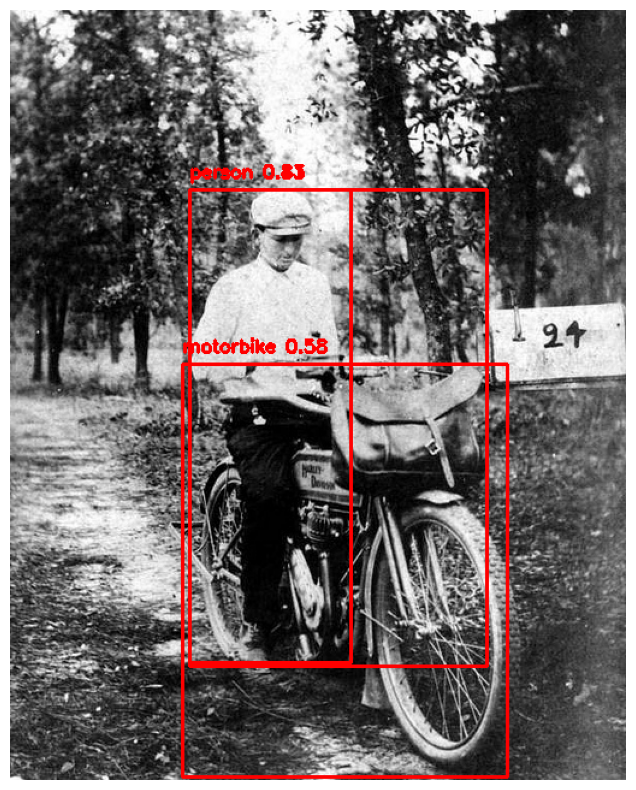

In [35]:
# Read the image
img_path = '/kaggle/input/to-test/000000000086.jpg'
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Draw bounding boxes
for result in results:
    for box in result.boxes:
        # Get coordinates and confidence
        x1, y1, x2, y2 = box.xyxy[0]  # Only the coordinates
        conf = box.conf[0]  # Confidence
        cls = box.cls[0]    # Class index

        label = f'{model.names[int(cls)]} {conf:.2f}'
        cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)
        cv2.putText(img, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# Display the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()




image 1/1 /kaggle/input/testing/New folder/photo_5452071308935423640_y.jpg: 256x192 1 person, 8.5ms

Speed: 2.3ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 192)


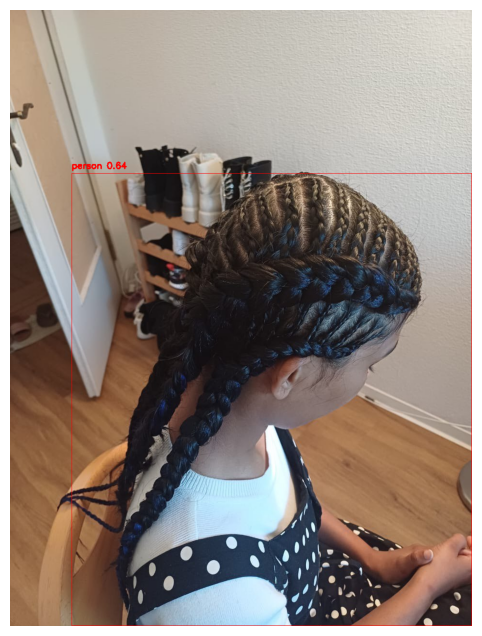



image 1/1 /kaggle/input/testing/New folder/horse_352290.jpg: 256x256 1 horse, 9.7ms

Speed: 1.0ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


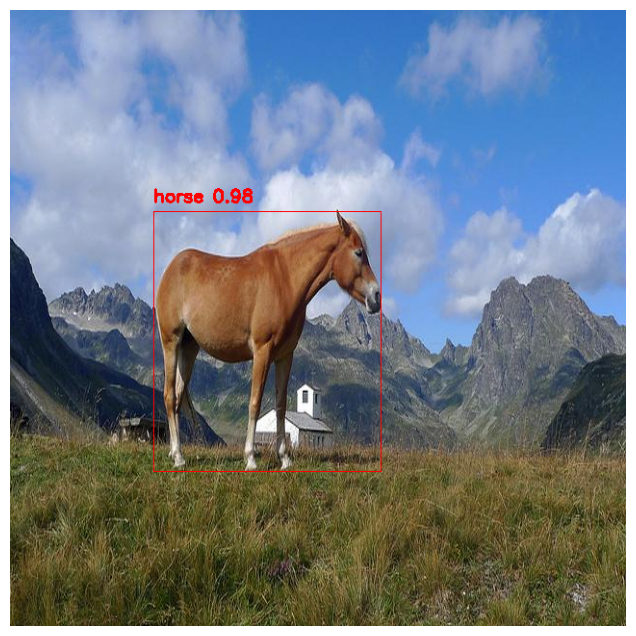



image 1/1 /kaggle/input/testing/New folder/cat_303219.jpg: 256x256 2 chairs, 2 persons, 1 sofa, 8.4ms

Speed: 1.1ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


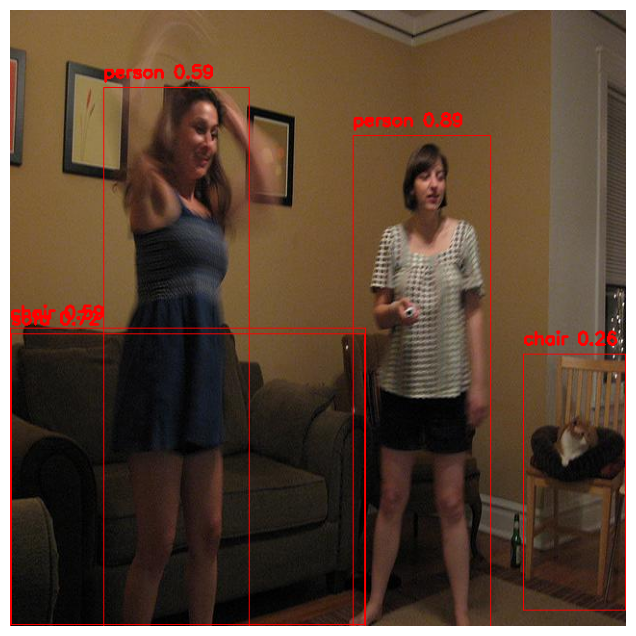



image 1/1 /kaggle/input/testing/New folder/photo_5452071308935423509_y.jpg: 256x192 1 dog, 2 persons, 9.0ms

Speed: 1.0ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 192)


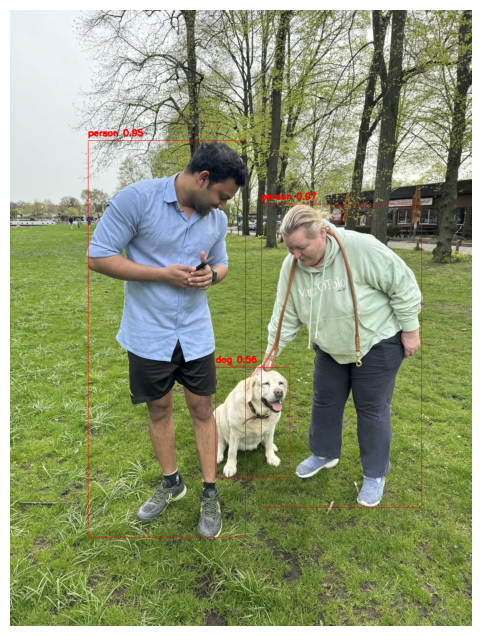



image 1/1 /kaggle/input/testing/New folder/cat_115070.jpg: 256x256 2 cats, 1 pottedplant, 9.3ms

Speed: 1.1ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


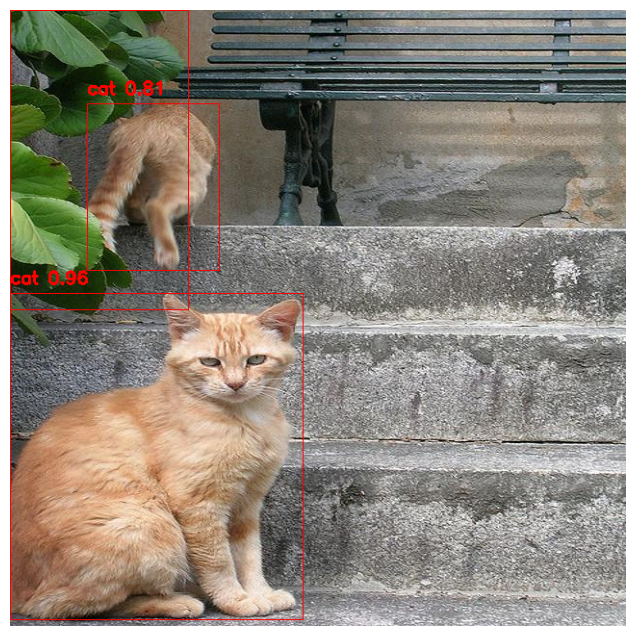



image 1/1 /kaggle/input/testing/New folder/horse_139561.jpg: 256x256 2 horses, 9.4ms

Speed: 1.1ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


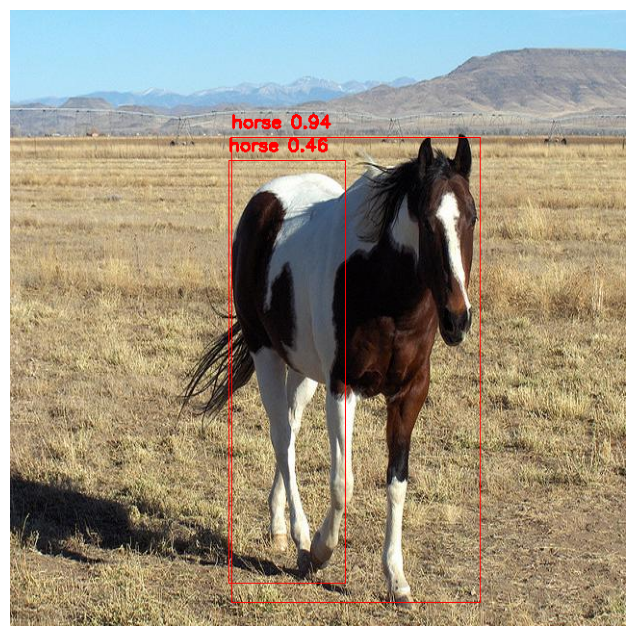



image 1/1 /kaggle/input/testing/New folder/motorcycle_32997.jpg: 256x256 1 bicycle, 3 motorbikes, 3 persons, 1 pottedplant, 8.1ms

Speed: 1.0ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


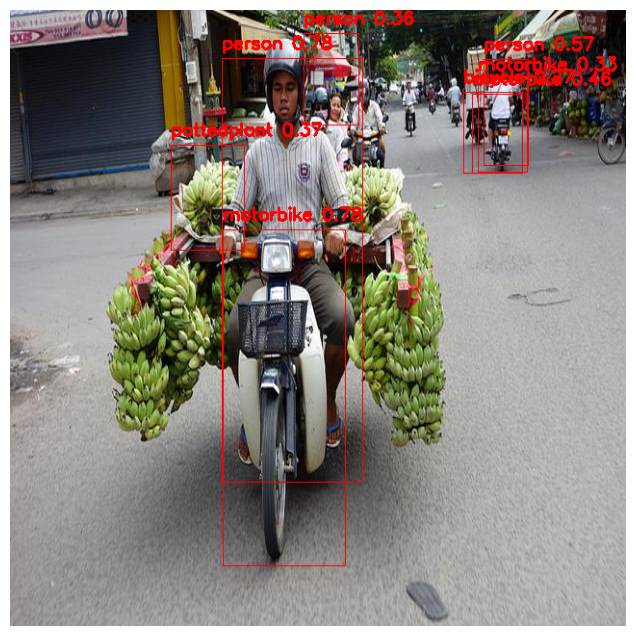



image 1/1 /kaggle/input/testing/New folder/photo_5452071308935423506_y.jpg: 256x192 1 bicycle, 2 persons, 9.6ms

Speed: 0.9ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 192)


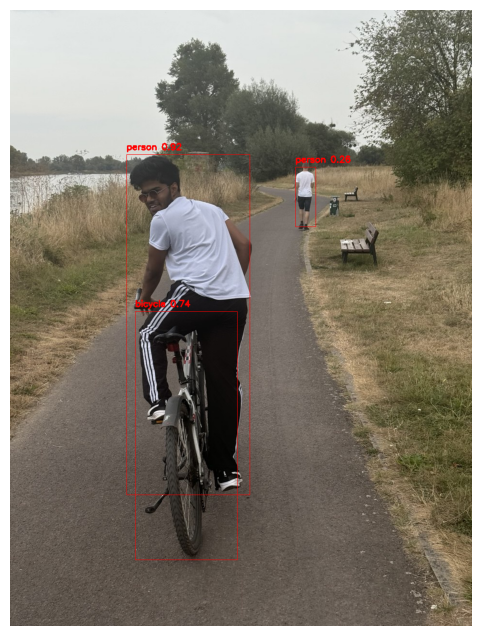



image 1/1 /kaggle/input/testing/New folder/bird_303439.jpg: 256x256 12 birds, 1 sheep, 9.1ms

Speed: 1.0ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


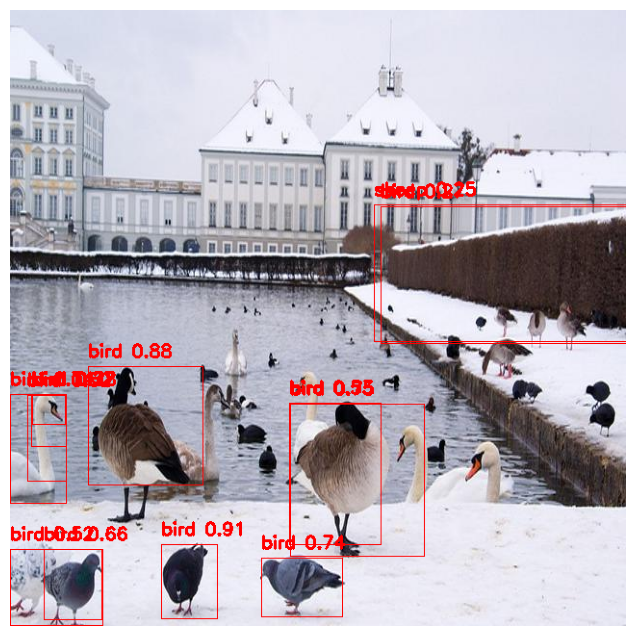



image 1/1 /kaggle/input/testing/New folder/000000000049.jpg: 256x224 1 horse, 2 persons, 9.7ms

Speed: 1.0ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 224)


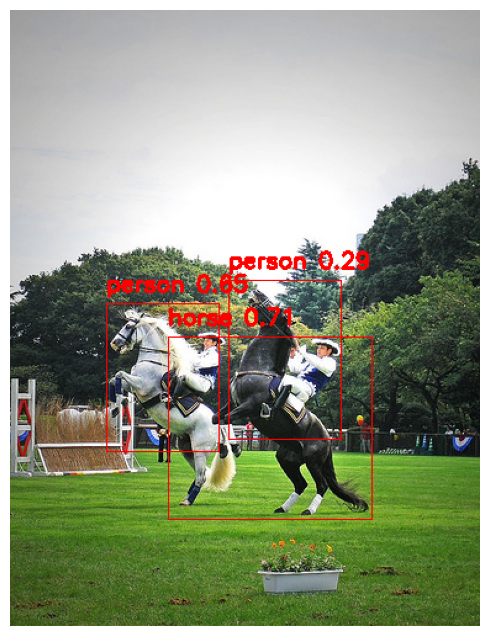



image 1/1 /kaggle/input/testing/New folder/000000000086.jpg: 256x224 1 motorbike, 2 persons, 9.5ms

Speed: 1.0ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 224)


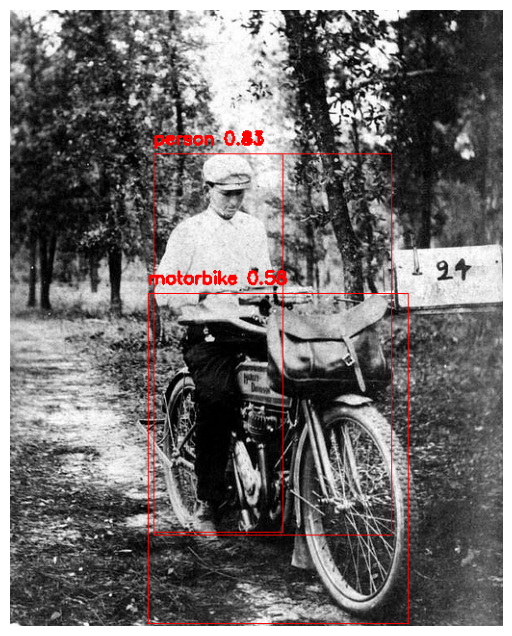



image 1/1 /kaggle/input/testing/New folder/bird_98601.jpg: 256x256 2 birds, 4 boats, 2 persons, 9.3ms

Speed: 1.0ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


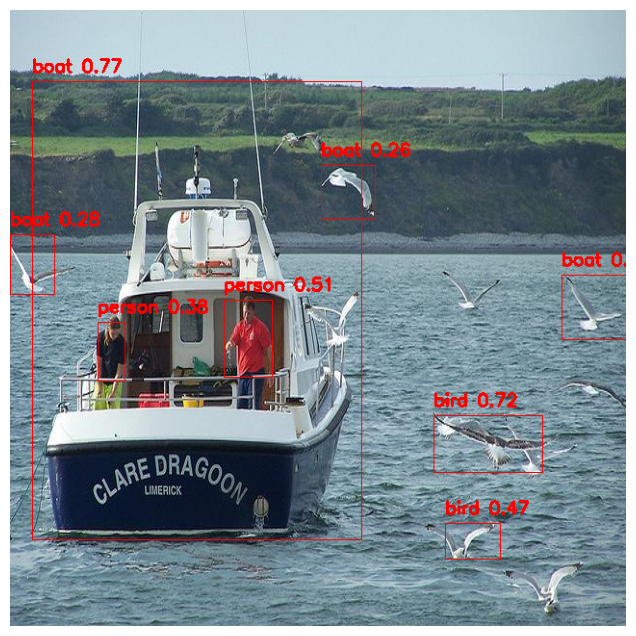



image 1/1 /kaggle/input/testing/New folder/000000016513.jpg: 192x256 1 bus, 10.8ms

Speed: 1.3ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 256)


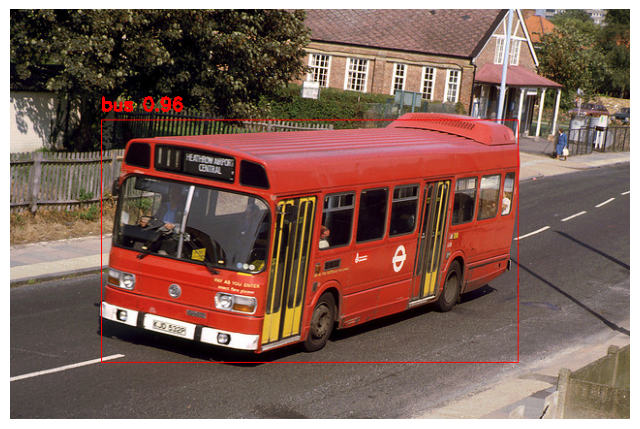



image 1/1 /kaggle/input/testing/New folder/WIN_20240130_18_35_35_Pro.jpg: 160x256 3 persons, 9.7ms

Speed: 0.9ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 256)


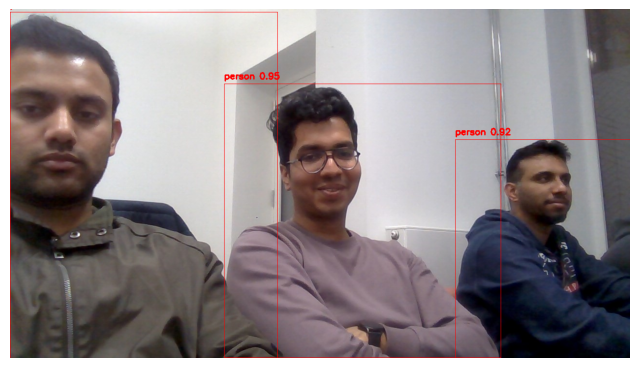



image 1/1 /kaggle/input/testing/New folder/bird_57830.jpg: 256x256 2 boats, 8.9ms

Speed: 1.0ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)


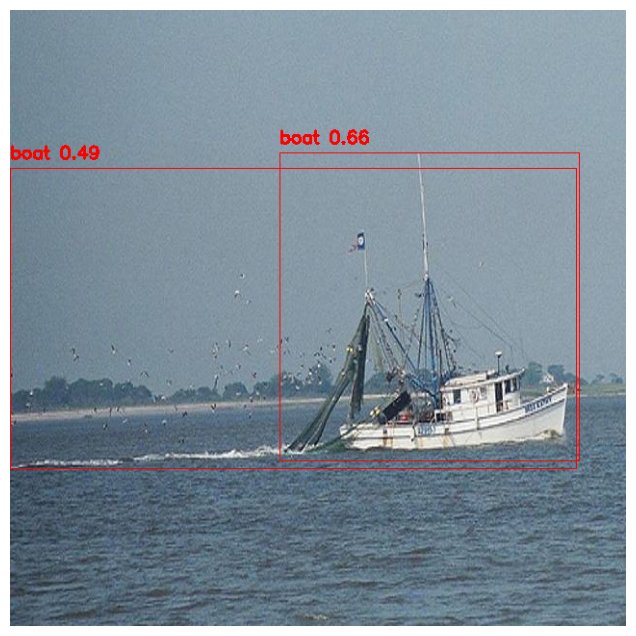



image 1/1 /kaggle/input/testing/New folder/cat_90331.jpg: 256x256 2 bottles, 1 cat, 1 person, 8.5ms

Speed: 1.1ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


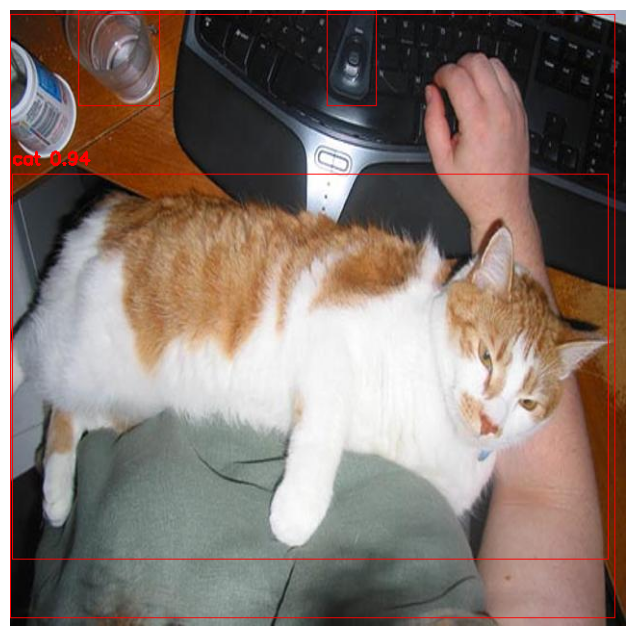



image 1/1 /kaggle/input/testing/New folder/000000000165.jpg: 224x256 2 persons, 9.3ms

Speed: 1.0ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 256)


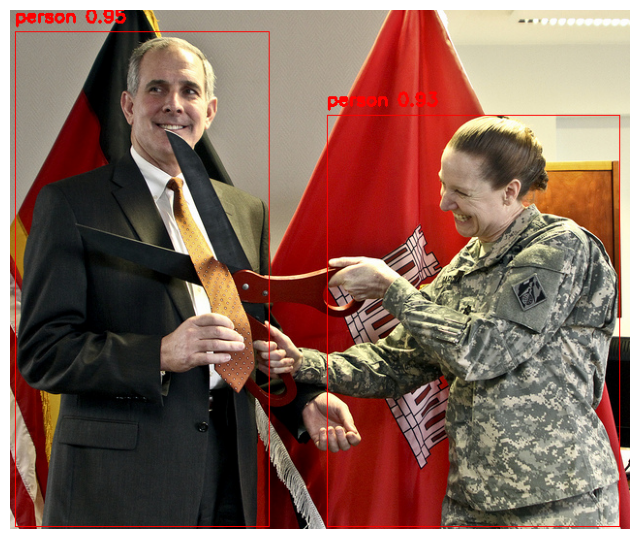



image 1/1 /kaggle/input/testing/New folder/000000000081.jpg: 192x256 1 aeroplane, 9.2ms

Speed: 0.8ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 256)


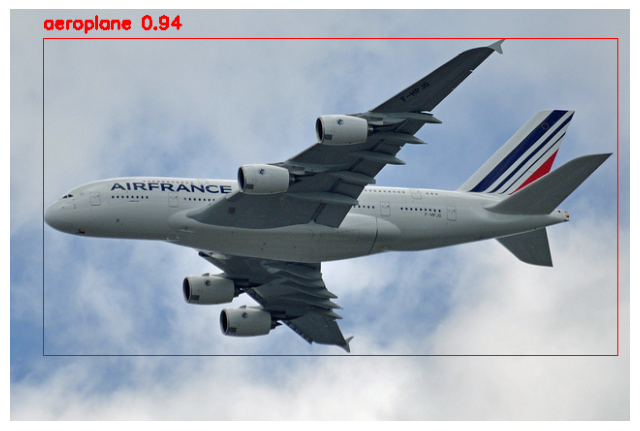



image 1/1 /kaggle/input/testing/New folder/horse_336172.jpg: 256x224 1 horse, 1 person, 9.1ms

Speed: 0.9ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 224)


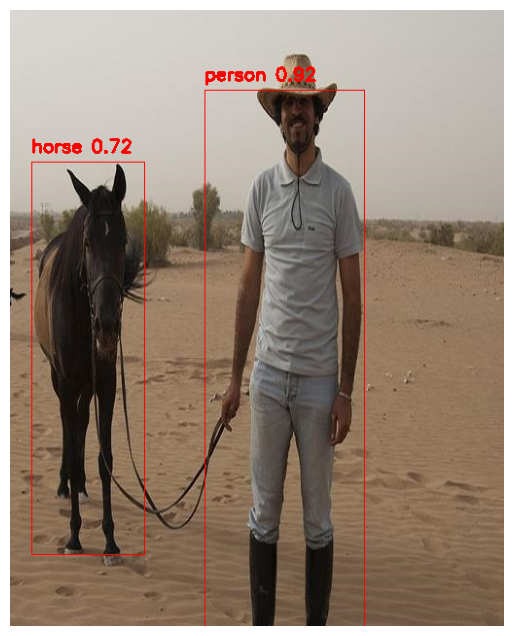



image 1/1 /kaggle/input/testing/New folder/horse_295194.jpg: 256x256 3 horses, 2 persons, 9.6ms

Speed: 1.1ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 256)


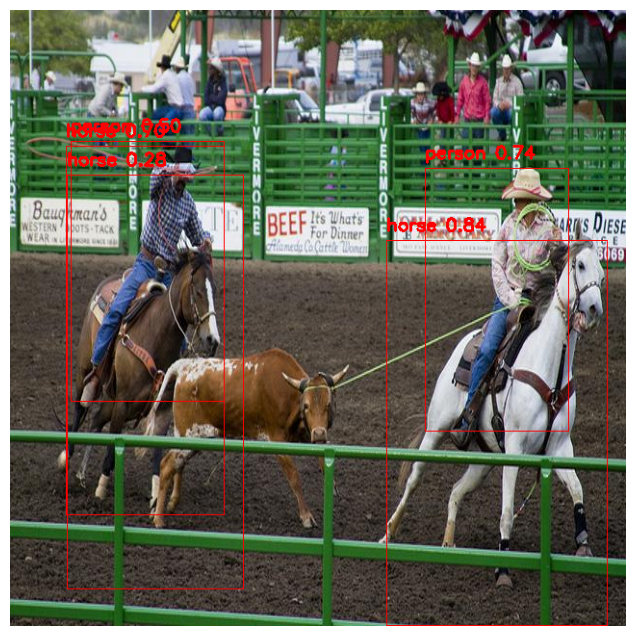



image 1/1 /kaggle/input/testing/New folder/photo_5452071308935423508_y.jpg: 256x192 1 cow, 10 sheeps, 9.4ms

Speed: 1.0ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 192)


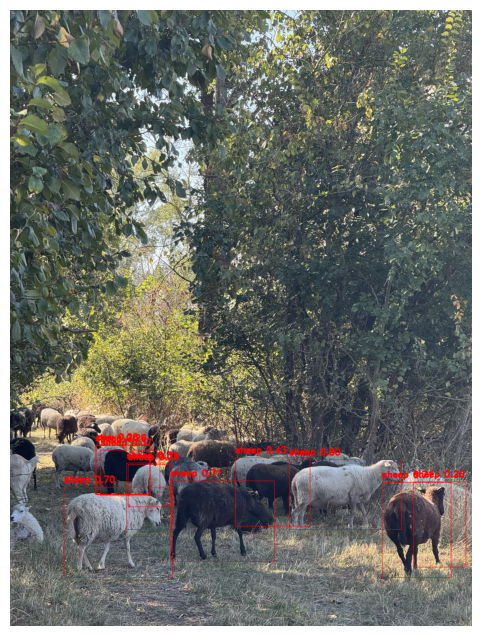



image 1/1 /kaggle/input/testing/New folder/photo_5452071308935423505_y.jpg: 256x192 1 boat, 6 persons, 8.2ms

Speed: 1.0ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 192)


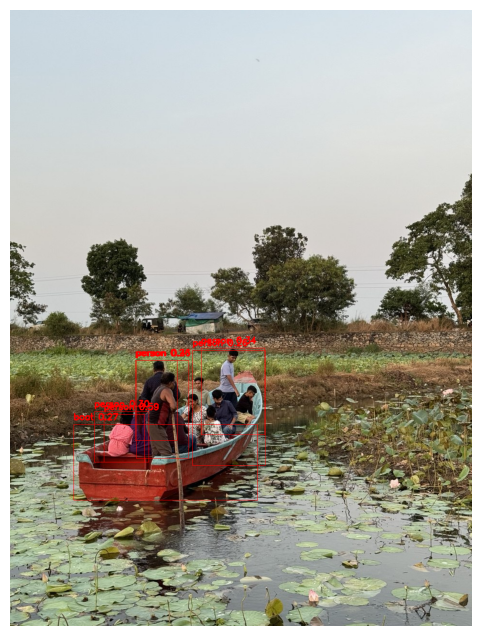

In [51]:
import os
import cv2
import matplotlib.pyplot as plt

# Path to the folder containing images
folder_path = '/kaggle/input/testing/New folder'

# Loop through all files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):  # Check for jpg files
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Run inference
        results = model.predict(img_path, conf=0.25)

        # Draw bounding boxes
        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = box.xyxy[0]
                conf = box.conf[0]
                cls = box.cls[0]

                label = f'{model.names[int(cls)]} {conf:.2f}'
                cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 1)
                cv2.putText(img, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)  


        # Display the image with bounding boxes
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
